# Stage 3-1 — CASA `simobserve` and dirty-image generation

Stage 1が保存したlensed sky FITSを読み、`simobserve`と`tclean(niter=0)`を実行し Stage 3-2で使用するDirty imageとStage 4で使用する visibilityを作成する。
最初のpilot観測で必要な天体fluxを測り、`inbright`を`mock_stage3.toml`で指定されたS/N比を満たすようにスケーリングして再度`simobserve`する。加えて、データ量削減のためTOMLで指定したbaseline-dependent time averagingを行う。

In [1]:
import os

# 1 case = 1 process = 1 CPU thread。CASA内部のthread並列を止める。
for variable in (
    "OMP_NUM_THREADS", "OPENBLAS_NUM_THREADS", "MKL_NUM_THREADS",
    "NUMEXPR_NUM_THREADS", "VECLIB_MAXIMUM_THREADS",
):
    os.environ[variable] = "1"

import hashlib
import json
import multiprocessing as mp
import shutil
try:
    import tomllib
except ModuleNotFoundError:  # Python < 3.11 in some CASA environments
    import tomli as tomllib
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.table import Table
import astropy.units as u
from casatasks import exportfits, simobserve, tclean
from casatools import table
from glint.uv_processing import (
    line_free_fitspw,
    line_free_sigma_scale,
    load_processed_uv,
    ms_channel_freqs,
    ms_to_processed_uv,
    run_statwt_linefree,
    save_processed_uv,
    time_channel_average_ms,
    velocity_axis_kms,
)

%matplotlib inline

EXAMPLE_DIR = Path.cwd().resolve()
if EXAMPLE_DIR.name == "examples":
    EXAMPLE_DIR = EXAMPLE_DIR / "forward_mass"
if not (EXAMPLE_DIR.name == "forward_mass" and EXAMPLE_DIR.parent.name == "examples"):
    raise FileNotFoundError("Run this notebook from examples/forward_mass or examples.")


## Stage 1 mockとALMA設定の読み込み

- `mock_truth.toml`: celestial frameとspectral frame
- `mock_manifest.json`: Stage 1が保存したFITSの場所とhash
- Stage 1 FITS header: sky frame、phase center、pixel grid、周波数軸
- `mock_stage3.toml`: array構成、積分時間、天候、weighting、目標peak S/N

Stage 3-1ではsky geometryを再定義せず、Stage 1 FITS headerをCASAへそのまま渡す。
FITSのhashが変わったcaseだけ再計算する。

In [2]:
# sky frameと観測・撮像・S/N規格化の設定を読む。
with (EXAMPLE_DIR / "mock_truth.toml").open("rb") as handle:
    TRUTH_CONFIG = tomllib.load(handle)
with (EXAMPLE_DIR / "mock_stage3.toml").open("rb") as handle:
    CONFIG = tomllib.load(handle)
SKY_COORDINATE_FRAME = str(TRUTH_CONFIG["target"]["coordinate_frame"])
SPECTRAL_FRAME = str(TRUTH_CONFIG["spectral"]["spectral_frame"])
FITS_SPECTRAL_FRAME = {"BARY": "BARYCENT"}.get(
    SPECTRAL_FRAME, SPECTRAL_FRAME,
)

# Stage 1のFITSを再生成せず、そのmanifestから読み込む。
MANIFEST_PATH = EXAMPLE_DIR / "output" / "stage1" / "products" / "mock_manifest.json"
if not MANIFEST_PATH.exists():
    raise FileNotFoundError("Run Stage 1 first to create output/stage1/products/mock_manifest.json")
MOCK_MANIFEST = json.loads(MANIFEST_PATH.read_text())
if MOCK_MANIFEST.get("schema_version") != 2:
    raise ValueError("Unsupported Stage 1 manifest schema")

alma_cfg = CONFIG["alma"]
manifest_sky_cases = MOCK_MANIFEST["cases"]
REFERENCE_SKY_PATH = (
    MANIFEST_PATH.parent / manifest_sky_cases[0]["lensed_sky_cube"]
).resolve()
REFERENCE_SKY_HEADER = fits.getheader(REFERENCE_SKY_PATH)
assert str(REFERENCE_SKY_HEADER["RADESYS"]) == SKY_COORDINATE_FRAME
assert str(REFERENCE_SKY_HEADER["SPECSYS"]) == FITS_SPECTRAL_FRAME

# 撮像に必要な値もStage 1 FITS headerから読む。
IMAGE_GRID_SIZE = int(REFERENCE_SKY_HEADER["NAXIS1"])
IMAGE_PIXEL_SIZE_ARCSEC = abs(
    (REFERENCE_SKY_HEADER["CDELT1"] * u.Unit(REFERENCE_SKY_HEADER["CUNIT1"]))
    .to_value(u.arcsec)
)
IMAGE_HALF_SIZE_ARCSEC = 0.5 * IMAGE_GRID_SIZE * IMAGE_PIXEL_SIZE_ARCSEC
REFERENCE_FREQUENCY_HZ = float(REFERENCE_SKY_HEADER["RESTFRQ"])

STAGE3_DIR = EXAMPLE_DIR / "output" / "stage3"
CASA_WORK_DIR = STAGE3_DIR / "casa_work"
PRODUCT_DIR = STAGE3_DIR / "products"
CASA_WORK_DIR.mkdir(parents=True, exist_ok=True)
PRODUCT_DIR.mkdir(parents=True, exist_ok=True)
ANTENNA_CONFIG_PATH = (EXAMPLE_DIR / alma_cfg["antenna_configuration"]).resolve()

print(
    f'Loaded {len(manifest_sky_cases)} Stage 1 sky models; '
    f'CASA geometry comes from {REFERENCE_SKY_PATH.name} '
    f'({SKY_COORDINATE_FRAME}, {SPECTRAL_FRAME}, {IMAGE_GRID_SIZE} px, '
    f'{IMAGE_PIXEL_SIZE_ARCSEC:g} arcsec/px)'
)


Loaded 7 Stage 1 sky models; CASA geometry comes from lensed_sky_cube.fits (ICRS, BARY, 200 px, 0.03 arcsec/px)


## CASA・FITS用の補助関数

ここでは次の処理をまとめる。

- velocityとfrequencyの変換
- CASA FITS cubeの読み込みとchannel順の統一
- dirty RMSの推定
- MSからvisibility、weight、flag、uvwを抽出
- noiseless/noisy MSを使ったnoise振幅の調整

Stage 3-1だけで使う処理なのでnotebook内に置く。

In [3]:
"""Small, CASA-independent helpers for ALMA mock-data experiments."""

from pathlib import Path

import numpy as np
from astropy.io import fits

C_KMS = 299792.458


def load_casa_cube(
    path: str | Path, reference_frequency_hz: float
) -> tuple[np.ndarray, np.ndarray, fits.Header]:
    """Load a CASA-exported FITS cube and sort its channels by velocity."""
    data, header = fits.getdata(path, header=True)
    cube = np.squeeze(np.asarray(data, dtype=np.float32))
    if cube.ndim != 3:
        raise ValueError(f"expected a 3D cube after squeeze, got {cube.shape}")
    channels = np.arange(cube.shape[0], dtype=float) + 1.0
    frequencies_hz = header["CRVAL3"] + (channels - header["CRPIX3"]) * header["CDELT3"]
    velocity_kms = C_KMS * (1.0 - frequencies_hz / reference_frequency_hz)
    order = np.argsort(velocity_kms)
    return cube[order], velocity_kms[order], header


# 輝線のないcube両端から外れ値に強いRMSを測る。
def robust_dirty_rms(cube: np.ndarray, edge_channels: int = 2) -> float:
    """Estimate image RMS from line-free channels using the MAD."""
    if edge_channels < 1 or 2 * edge_channels > cube.shape[0]:
        raise ValueError("edge_channels is incompatible with the cube")
    samples = np.concatenate((cube[:edge_channels].ravel(), cube[-edge_channels:].ravel()))
    median = np.median(samples)
    return float(1.482602218505602 * np.median(np.abs(samples - median)))


In [4]:
def _remove_products(prefix: Path) -> None:
    for path in prefix.parent.glob(prefix.name + ".*"):
        if path.is_dir():
            shutil.rmtree(path)
        else:
            path.unlink()


def _find_noisy_ms(project: Path) -> Path:
    matches = sorted(project.glob("*.noisy.ms"))
    if len(matches) != 1:
        raise RuntimeError(f"expected one noisy MS in {project}, found {matches}")
    return matches[0]


def _find_noiseless_ms(project: Path) -> Path:
    matches = sorted(
        path for path in project.glob("*.ms") if not path.name.endswith(".noisy.ms")
    )
    if len(matches) != 1:
        raise RuntimeError(f"expected one noiseless MS in {project}, found {matches}")
    return matches[0]


def _cleanup_case_workdir(project: Path, averaged_ms: Path) -> None:
    """Keep the averaged data MS and compact noisy/signal UV archives."""
    keep = {
        averaged_ms.resolve(), (project / "uv_data.npz").resolve(),
        (project / "signal_uv_data.npz").resolve(),
    }
    for path in project.iterdir():
        if path.resolve() in keep:
            continue
        shutil.rmtree(path) if path.is_dir() else path.unlink()


def _line_velocity_cut_kms(ms_path: Path, reference_frequency_hz: float, edge_channels: int) -> float:
    """両端edge_channelsずつがline-freeになる速度cutを、MSのchannel gridから決める。

    G09と同じ「|v| >= cut がline-free」の規約に載せるための換算。非対称なgridで
    想定channel数にならない場合はエラーにする。
    """
    v_kms = velocity_axis_kms(ms_channel_freqs(ms_path), reference_frequency_hz)
    v_sorted = np.sort(v_kms)
    cut = 0.5 * (abs(v_sorted[edge_channels - 1]) + abs(v_sorted[edge_channels]))
    cut = min(cut, 0.5 * (abs(v_sorted[-edge_channels]) + abs(v_sorted[-edge_channels - 1])))
    n_line_free = int(np.sum(np.abs(v_kms) >= cut))
    if n_line_free != 2 * edge_channels:
        raise ValueError(
            f"velocity cut {cut:.1f} km/s selects {n_line_free} line-free channels, "
            f"expected {2 * edge_channels}"
        )
    return float(cut)


def _copy_weight_columns(source_ms: Path, target_ms: Path) -> None:
    """statwt後のnoisy MSのWEIGHT/SIGMA（と*_SPECTRUM）をnoiseless MSへコピーする。

    両MSを同じweightで時間平均することで、平均後もnoisy−noiselessが
    純粋なthermal noiseのまま保たれる（noiselessはline-freeで分散0のため
    statwtを直接掛けられない）。CASAの規約でDATA列にはSIGMA、CORRECTED列には
    WEIGHTが対応し、simobserve MS（CORRECTED_DATAあり）へのstatwt(datacolumn='data')
    はSIGMAを更新、mstransform(datacolumn='data')は出力weightを入力SIGMAから作る。
    したがってSIGMAのコピーが本質で、これで平均後のUVW/WEIGHTがbit一致する。
    """
    tb_source = table()
    tb_source.open(str(source_ms))
    source_columns = set(tb_source.colnames())
    copied = {name: tb_source.getcol(name) for name in
              ("WEIGHT", "SIGMA", "WEIGHT_SPECTRUM", "SIGMA_SPECTRUM")
              if name in source_columns}
    tb_source.close()
    tb_target = table()
    tb_target.open(str(target_ms), nomodify=False)
    target_columns = set(tb_target.colnames())
    for name, value in copied.items():
        if name in target_columns:
            tb_target.putcol(name, value)
    tb_target.close()


def _average_ms(input_ms: Path, output_ms: Path, max_uv_distance_m: float) -> None:
    """Baseline-dependent time averaging without frequency averaging."""
    # 周波数regridは行わず、simobserveで作ったspectral frameを保持する。
    # G09と同じglintラッパーを使う（timebin無限大＝scan内をuv変位だけで区切る）。
    time_channel_average_ms(
        input_ms, output_ms, timebin="10000000s",
        maxuvwdistance_m=float(max_uv_distance_m), overwrite=True,
    )


# niter=0なのでdeconvolutionせず、samplingとweightが作るdirty imageを得る。
def _make_dirty_fits(
    ms_path: Path, image_prefix: Path, fits_path: Path, common: dict
) -> np.ndarray:
    """Image one MS with niter=0, export it, and return velocity-sorted data."""
    _remove_products(image_prefix)
    tclean(
        vis=str(ms_path),
        datacolumn="data",
        imagename=str(image_prefix),
        imsize=int(common["imsize"]),
        cell=common["cell"],
        weighting=common["weighting"],
        robust=float(common["robust"]),
        niter=0,
        specmode="cube",
        interpolation="nearest",
        outframe=common["outframe"],
        stokes="I",
        restfreq=f'{common["reference_frequency_hz"]}Hz',
        interactive=False,
        parallel=False,
        calcres=True,
        calcpsf=True,
    )
    exportfits(
        imagename=str(image_prefix) + ".image",
        fitsimage=str(fits_path),
        dropdeg=True,
        overwrite=True,
    )
    cube, _, _ = load_casa_cube(fits_path, common["reference_frequency_hz"])
    return cube


def _peak_sn(cube: np.ndarray, edge_channels: int) -> float:
    rms = robust_dirty_rms(cube, edge_channels)
    return np.inf if rms == 0.0 else float(np.max(cube) / rms)


def _solve_flux_scale(
    signal_cube: np.ndarray,
    noisy_cube: np.ndarray,
    target_peak_sn: float,
    edge_channels: int,
) -> tuple[float, float, float]:
    """Find f for f * signal + fixed CASA noise at the target peak S/N."""
    if target_peak_sn <= 0:
        raise ValueError("target_peak_sn must be positive")
    # 同じsampling・weightで撮像した差をthermal-noise成分とみなす。
    noise_cube = noisy_cube - signal_cube
    pilot_peak_sn = _peak_sn(noisy_cube, edge_channels)

    def peak_sn(flux_scale):
        return _peak_sn(flux_scale * signal_cube + noise_cube, edge_channels)

    lower, upper = 0.0, 1.0
    if peak_sn(lower) >= target_peak_sn:
        raise RuntimeError("target peak S/N is below the noise-only image peak")
    # fluxを増やしてtargetを挟み、二分法でscaleを決める。
    while peak_sn(upper) < target_peak_sn and upper < 1.0e6:
        upper *= 2.0
    if peak_sn(upper) < target_peak_sn:
        raise RuntimeError(
            f"could not bracket target peak S/N={target_peak_sn:g}"
        )
    for _ in range(50):
        middle = 0.5 * (lower + upper)
        if peak_sn(middle) < target_peak_sn:
            lower = middle
        else:
            upper = middle
    flux_scale = 0.5 * (lower + upper)
    return flux_scale, pilot_peak_sn, peak_sn(flux_scale)


def _make_signal_dirty_with_noisy_weights(
    noiseless_ms: Path,
    noisy_ms: Path,
    image_prefix: Path,
    fits_path: Path,
    common: dict,
) -> np.ndarray:
    """Image noiseless DATA using exactly the noisy MS sampling and weights."""
    tb = table()
    tb.open(str(noiseless_ms))
    signal = np.asarray(tb.getcol("DATA"))
    tb.close()
    tb.open(str(noisy_ms), nomodify=False)
    original = np.asarray(tb.getcol("DATA"))
    if original.shape != signal.shape:
        tb.close()
        raise RuntimeError("noiseless and noisy DATA columns have different shapes")
    tb.putcol("DATA", signal)
    tb.close()
    try:
        return _make_dirty_fits(noisy_ms, image_prefix, fits_path, common)
    finally:
        tb.open(str(noisy_ms), nomodify=False)
        tb.putcol("DATA", original)
        tb.close()


def _run_simobserve(project: Path, common: dict, case: dict, inbright: str = "") -> None:
    """Run one CASA simulation with fixed observing conditions."""
    if project.exists():
        shutil.rmtree(project)
    project.parent.mkdir(parents=True, exist_ok=True)
    original_directory = Path.cwd()
    os.chdir(project.parent)
    try:
        simobserve(
            project=project.name,
            skymodel=str(Path(case["sky_model"]).resolve()),
            inbright=inbright,
            # 空間・周波数WCSとpointing範囲はStage 1 FITSから直接使う。
            indirection="", incell="", incenter="", inwidth="",
            outframe=common["outframe"],
            setpointings=True, integration=common["integration"],
            direction="", mapsize=["", ""],
            maptype="hexagonal", obsmode="int",
            antennalist=str(Path(common["antennalist"]).resolve()),
            refdate=common["refdate"], hourangle=common["hourangle"],
            totaltime=common["totaltime"], thermalnoise="tsys-atm",
            user_pwv=float(common["user_pwv_mm"]),
            t_ground=float(common["ground_temperature_k"]),
            seed=int(case["seed"]), graphics="none", verbose=False,
            overwrite=True,
        )
    finally:
        os.chdir(original_directory)


def _ms_rows(ms_path: Path) -> int:
    tb = table()
    tb.open(str(ms_path))
    rows = int(tb.nrows())
    tb.close()
    return rows


def run_case(common: dict, case: dict) -> dict:
    print(f"STAGE3_CASE_START {case['name']}: pid={os.getpid()}", flush=True)
    project = Path(case["project"]).resolve()
    pilot = project.with_name(project.name + "_pilot")
    edge_channels = int(common["line_free_edge_channels"])

    # 1回目は元fluxで観測し、CASAが作るnoiseは変更せず必要なfluxだけ測る。
    _run_simobserve(pilot, common, case)
    pilot_signal_ms = _find_noiseless_ms(pilot)
    pilot_noisy_ms = _find_noisy_ms(pilot)
    pilot_signal_avg = pilot / "signal.averaged.ms"
    pilot_noisy_avg = pilot / "noisy.averaged.ms"
    _average_ms(pilot_signal_ms, pilot_signal_avg, common["max_uv_distance_m"])
    _average_ms(pilot_noisy_ms, pilot_noisy_avg, common["max_uv_distance_m"])
    pilot_cube = _make_dirty_fits(
        pilot_noisy_avg, pilot / "pilot_dirty", pilot / "pilot_dirty.fits", common,
    )
    signal_cube = _make_signal_dirty_with_noisy_weights(
        pilot_signal_avg, pilot_noisy_avg,
        pilot / "signal_dirty", pilot / "signal_dirty.fits", common,
    )
    flux_scale, pilot_peak_sn, solved_peak_sn = _solve_flux_scale(
        signal_cube, pilot_cube, float(common["target_peak_sn"]), edge_channels,
    )
    sky_peak = float(np.nanmax(fits.getdata(case["sky_model"])))
    inbright_jy_per_pixel = sky_peak * flux_scale
    shutil.rmtree(pilot)

    # 2回目はinbrightだけ変更。同じ観測時間・PWVなのでthermal noiseは物理値のまま。
    _run_simobserve(
        project, common, case, inbright=f"{inbright_jy_per_pixel:.16g}Jy/pixel",
    )
    noiseless_ms = _find_noiseless_ms(project)
    noisy_ms = _find_noisy_ms(project)
    averaged_ms = project / "final.averaged.ms"
    averaged_signal_ms = project / "signal.averaged.ms"
    input_rows = _ms_rows(noisy_ms)
    # G09と同じ順序・同じパラメータで、平均前の（channel無相関で全積分が残る）MSへstatwtを掛ける。
    # 平均後だとbinあたりのサンプル数が激減して−1/νバイアスが数%になり、行ごとの積分時間差も
    # weightに反映できない（test_visibility_processing.ipynb §4「statwtは時間平均の前か後か」）。
    reference_frequency_hz = float(common["reference_frequency_hz"])
    edge_channels = int(common["line_free_edge_channels"])
    line_velocity_cut_kms = _line_velocity_cut_kms(
        noisy_ms, reference_frequency_hz, edge_channels
    )
    fitspw = line_free_fitspw(
        velocity_axis_kms(ms_channel_freqs(noisy_ms), reference_frequency_hz),
        line_velocity_cut_kms,
    )
    run_statwt_linefree(
        noisy_ms, fitspw=fitspw, datacolumn="data",
        combine="scan, corr", timebin="300s", minsamp=2, flagbackup=False,
    )
    _copy_weight_columns(noisy_ms, noiseless_ms)
    _average_ms(noisy_ms, averaged_ms, common["max_uv_distance_m"])
    # signal-only MSも同じbin・同じweightで平均し、Stage 4の数値誤差診断に使う。
    _average_ms(noiseless_ms, averaged_signal_ms, common["max_uv_distance_m"])
    averaged_rows = _ms_rows(averaged_ms)

    image_prefix = project / "dirty"
    final_cube = _make_dirty_fits(
        averaged_ms, image_prefix,
        Path(case["product_dir"]) / "dirty.image.fits", common,
    )
    achieved_peak_sn = _peak_sn(final_cube, edge_channels)
    exportfits(
        imagename=str(image_prefix) + ".psf",
        fitsimage=str(Path(case["product_dir"]) / "dirty.psf.fits"),
        dropdeg=True, overwrite=True,
    )
    # polarizationをweight平均し、後段で必要なvisibility情報をschema v2 NPZへ保存する。
    # G09と同じglintの読み出し経路（ms_to_processed_uv）を使う。
    # σの絶対スケールはG09と同じくfull-bandのline-free channelから測ってnpzへ記録し、
    # npz本体にはfitに使うline channelだけを保存する（line-freeはσ推定にのみ使う）。
    uv_full = ms_to_processed_uv(
        averaged_ms, reference_frequency_hz=reference_frequency_hz
    )
    sigma_scale_linefree = line_free_sigma_scale(
        uv_full, line_velocity_min_kms=line_velocity_cut_kms
    )
    save_processed_uv(
        ms_to_processed_uv(
            averaged_ms, reference_frequency_hz=reference_frequency_hz,
            line_velocity_max_kms=line_velocity_cut_kms,
        ),
        project / "uv_data.npz",
        extra={
            "sigma_scale_linefree": sigma_scale_linefree,
            "source_ms": str(averaged_ms),
        },
    )
    save_processed_uv(
        ms_to_processed_uv(
            averaged_signal_ms, reference_frequency_hz=reference_frequency_hz,
            line_velocity_max_kms=line_velocity_cut_kms,
        ),
        project / "signal_uv_data.npz",
    )
    normalization = {
        "target_peak_sn": float(common["target_peak_sn"]),
        "pilot_peak_sn": pilot_peak_sn,
        "flux_scale": flux_scale,
        "inbright_jy_per_pixel": inbright_jy_per_pixel,
        "solved_peak_sn": solved_peak_sn,
        "achieved_peak_sn": achieved_peak_sn,
        "max_uv_distance_m": float(common["max_uv_distance_m"]),
        "input_visibility_rows": input_rows,
        "averaged_visibility_rows": averaged_rows,
    }
    Path(case["normalization_path"]).write_text(
        json.dumps(normalization, indent=2, sort_keys=True)
    )
    print(
        f"STAGE3_CASE_COMPLETE {case['name']}: "
        f"peak S/N {pilot_peak_sn:.3f} -> {achieved_peak_sn:.3f}, "
        f"flux scale={flux_scale:.5g}, rows={input_rows:,}->{averaged_rows:,}"
    )
    # 最終FITSはproductsに保存済み。作業領域には平均済みMSとUV archiveだけ残す。
    _cleanup_case_workdir(project, averaged_ms)
    return normalization




## `simobserve`、flux規格化、dirty image作成

各caseについて以下を行う。

1. 元fluxでpilot `simobserve`を行う
2. 固定CASA noiseに対して必要な天体flux scaleを求める
3. `inbright`だけを変更して同じ1時間観測を再実行する
4. TOMLの`max_uv_distance_m`を上限に時間平均する
5. 平均済みMSからdirty image、dirty PSF、visibilityを保存する

既存productのsignatureが現在の設定と一致すれば、そのcaseはskipする。
再計算が必要なcaseはcase数と同数の独立processで同時実行する（全7 caseなら7 process）。

In [5]:
# 再計算が必要なcaseだけこのlistへ入れる。
manifest_cases = []
for case_index, case in enumerate(MOCK_MANIFEST["cases"]):
    name = case["name"]
    sky_path = (MANIFEST_PATH.parent / case["lensed_sky_cube"]).resolve()
    if not sky_path.exists():
        raise FileNotFoundError(f"Missing Stage 1 sky model: {sky_path}")
    # manifest記録時からStage 1 FITSが変わっていないか確認する。
    sky_sha256 = hashlib.sha256(sky_path.read_bytes()).hexdigest()
    if sky_sha256 != case["lensed_sha256"]:
        raise ValueError(f"Stage 1 sky-model checksum mismatch: {name}")
    case_dir = CASA_WORK_DIR / name
    project = case_dir / "simulation"
    product_dir = PRODUCT_DIR / name
    product_dir.mkdir(parents=True, exist_ok=True)
    required = (
        product_dir / "dirty.image.fits",
        product_dir / "dirty.psf.fits",
        project / "uv_data.npz",
        project / "signal_uv_data.npz",
        product_dir / "sn_normalization.json",
    )
    signature = {
        "schema_version": 7,  # statwt導入・line channelのみexport・SIGMAコピー修正で全case再計算
        "alma": alma_cfg,
        "case_name": name,
        "lensed_sha256": sky_sha256,
        "line_free_edge_channels": int(
            CONFIG["image_fit"]["line_free_edge_channels"]
        ),
    }
    signature_path = product_dir / "simulation_signature.json"
    # 必要ファイルとsignatureが揃うcaseはCASA計算を再利用する。
    current = all(path.exists() for path in required)
    if current:
        try:
            current = json.loads(signature_path.read_text()) == signature
        except (OSError, json.JSONDecodeError):
            current = False
    if not current or os.getenv("STAGE3_FORCE_SIMOBSERVE", "0") == "1":
        manifest_cases.append({
            "name": name,
            "sky_model": str(sky_path),
            "project": str(project),
            "product_dir": str(product_dir),
            "normalization_path": str(product_dir / "sn_normalization.json"),
            "seed": int(alma_cfg["random_seed"]) + case_index,
            "signature": signature,
            "signature_path": str(signature_path),
        })

# 全caseで共通するCASA引数。caseごとに変わるのはsky modelとseedだけ。
common = {
    "cell": f"{IMAGE_PIXEL_SIZE_ARCSEC:.12g}arcsec",
    "imsize": IMAGE_GRID_SIZE,
    "outframe": SPECTRAL_FRAME,
    "antennalist": str(ANTENNA_CONFIG_PATH),
    "integration": alma_cfg["integration"],
    "totaltime": alma_cfg["total_time"],
    "refdate": alma_cfg["reference_date"],
    "hourangle": alma_cfg["hour_angle"],
    "user_pwv_mm": alma_cfg["user_pwv_mm"],
    "ground_temperature_k": alma_cfg["ground_temperature_k"],
    "weighting": alma_cfg["weighting"],
    "robust": alma_cfg["robust"],
    "reference_frequency_hz": REFERENCE_FREQUENCY_HZ,
    "target_peak_sn": float(alma_cfg["target_peak_sn"]),
    "max_uv_distance_m": float(alma_cfg["max_uv_distance_m"]),
    "line_free_edge_channels": int(CONFIG["image_fit"]["line_free_edge_channels"]),
}

def run_case_task(task):
    """Run one independent CASA case and record its completed signature."""
    task_common, item = task
    run_case(task_common, item)
    Path(item["signature_path"]).write_text(
        json.dumps(item["signature"], indent=2, sort_keys=True)
    )
    return item["name"]


if manifest_cases:
    worker_count = len(manifest_cases)
    print(f"Running {worker_count} independent CASA case(s) in parallel.")
    fork_context = mp.get_context("fork")
    with fork_context.Pool(
        processes=worker_count, maxtasksperchild=1,
    ) as pool:
        completed_cases = pool.map(
            run_case_task, [(common, item) for item in manifest_cases],
        )
    print(f"Completed CASA cases: {', '.join(completed_cases)}")
else:
    print("All CASA products match the Stage 1 sky models and current ALMA settings.")


All CASA products match the Stage 1 sky models and current ALMA settings.


## dirty cubeの確認

全channel mapとcaseごとの要約表を表示する。表ではdirty RMS、peak S/N、flux scale、平均前後のvisibility数を確認する。

目標値と実測値がずれる場合は、`sn_normalization.json`とline-free channelを先に確認する。

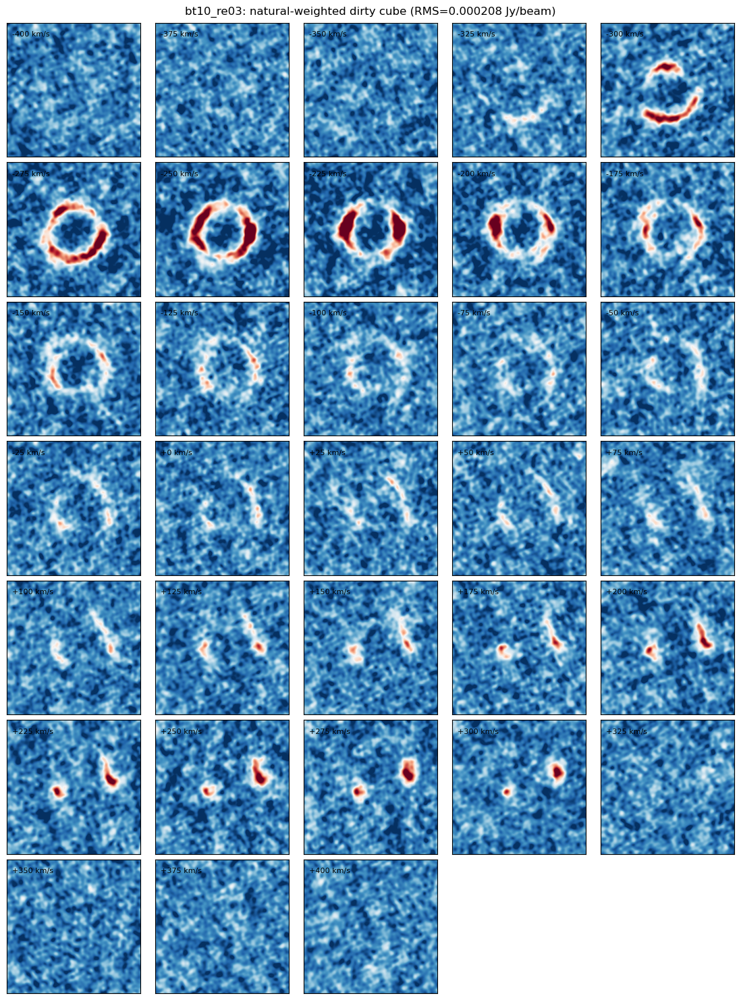

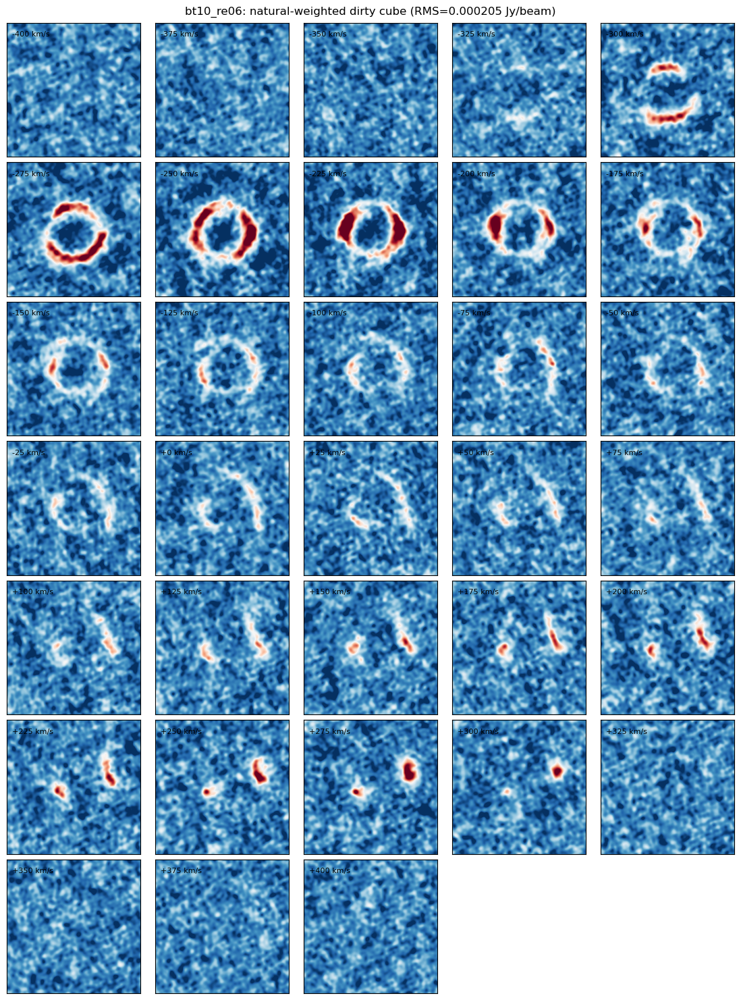

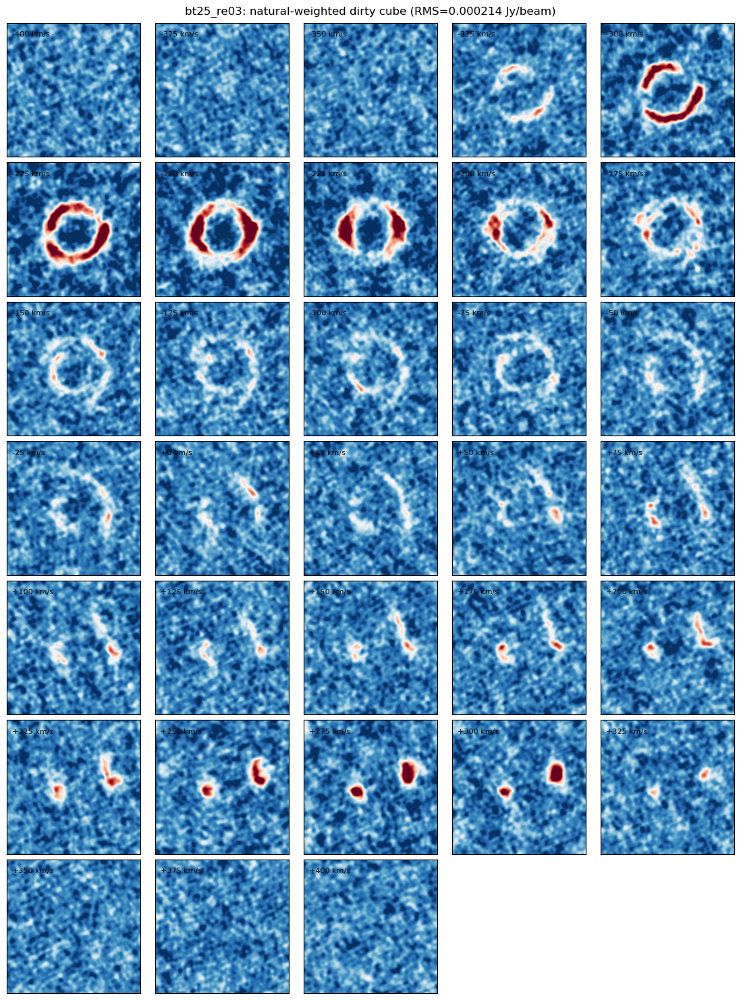

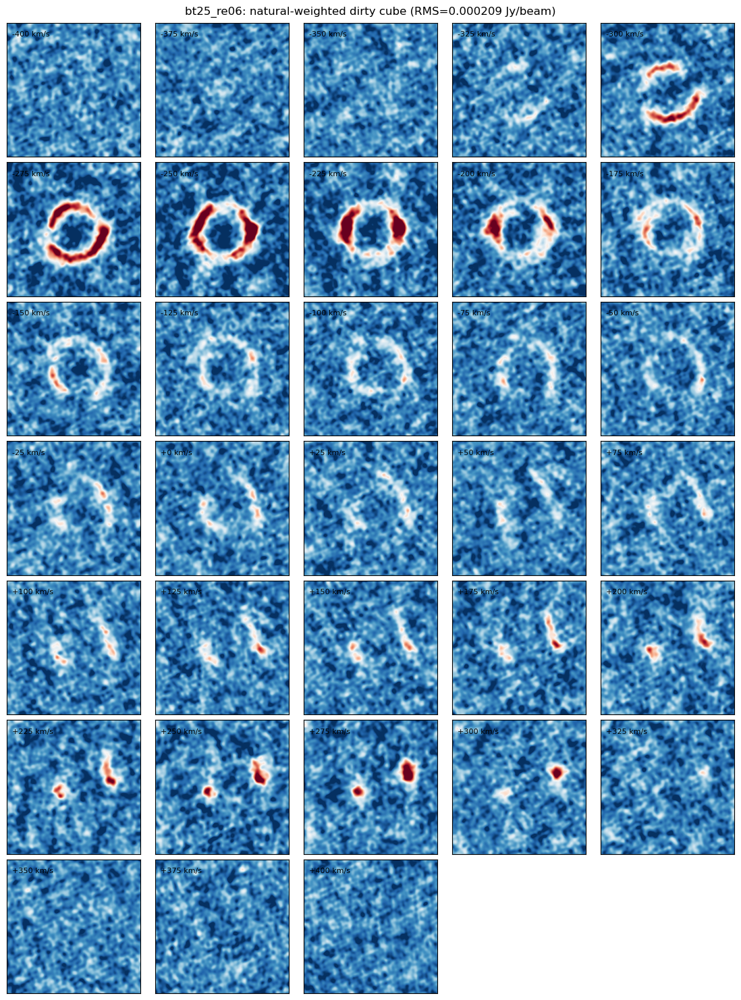

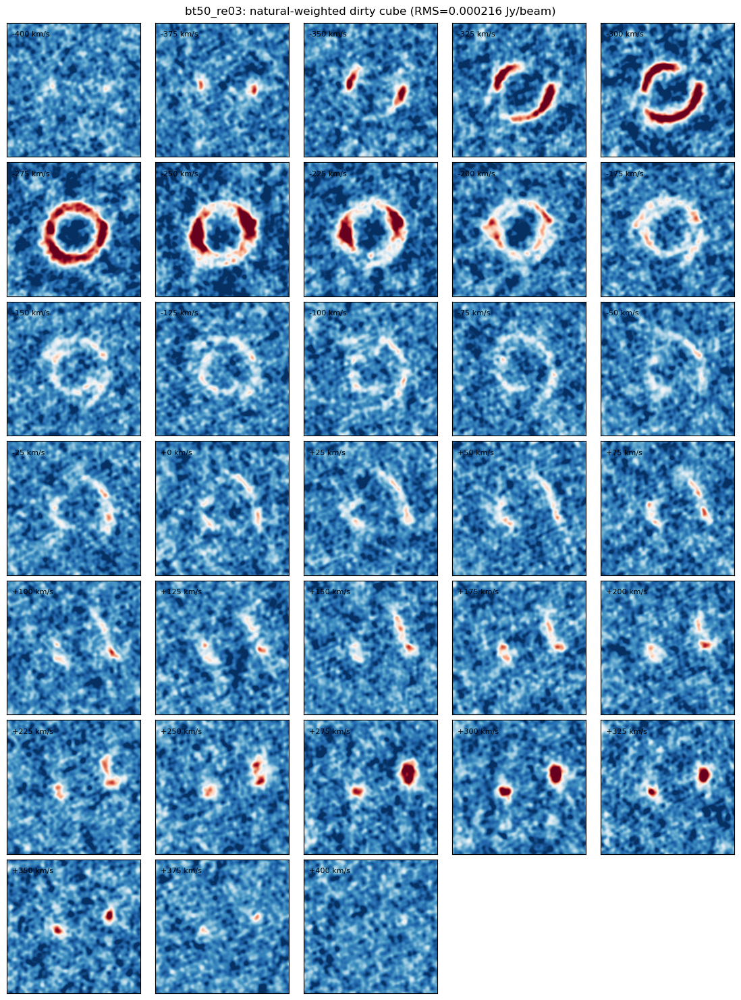

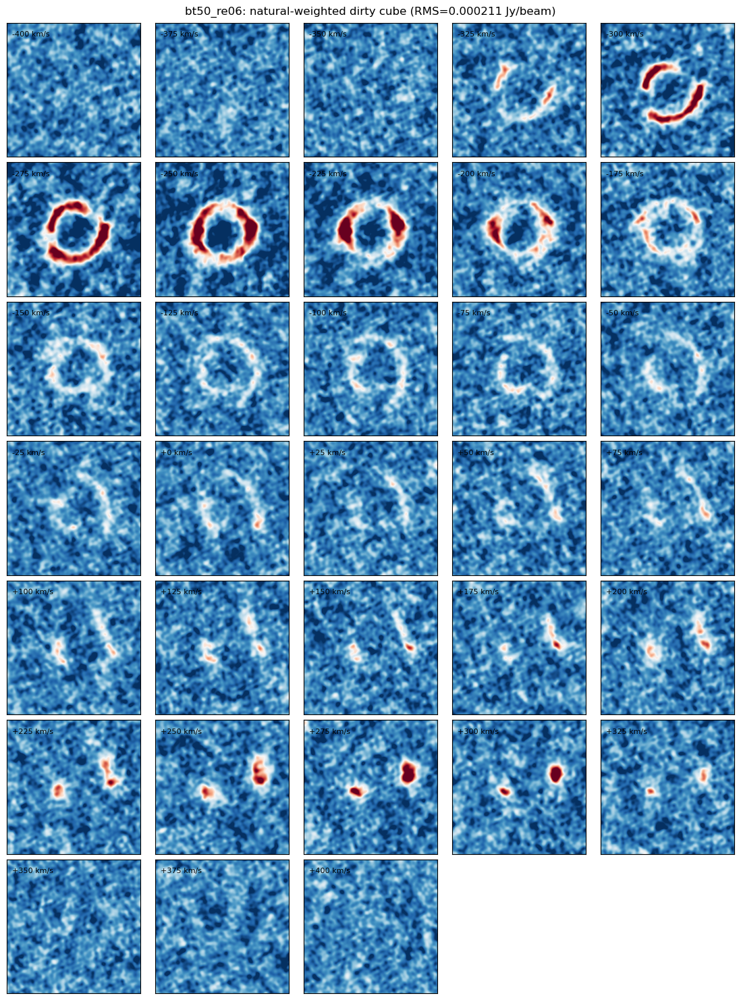

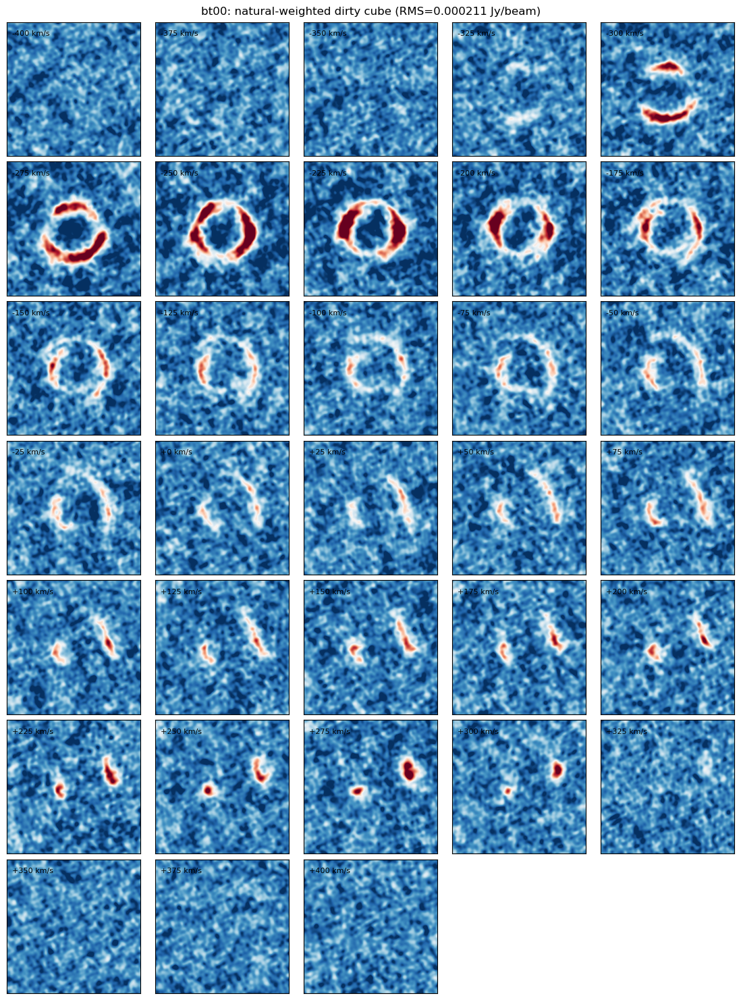

case,dirty RMS [Jy/beam],peak S/N,target peak S/N,flux scale,rows before,rows after,exported visibility rows
str9,float64,float32,float64,float64,int64,int64,int64
bt10_re03,0.00020795005548279732,20.085611,20.0,0.3081343322992329,325080,6132,6132
bt10_re06,0.00020535007934086025,20.042484,20.0,0.30829803645610765,325080,6132,6132
bt25_re03,0.0002135558897862211,20.037256,20.0,0.36157588660716966,325080,6132,6132
bt25_re06,0.00020894377666991204,19.961432,20.0,0.31560193002223924,325080,6132,6132
bt50_re03,0.00021641553030349314,19.978893,20.0,0.41188140213489577,325080,6132,6132
bt50_re06,0.00021124290651641786,20.043434,20.0,0.34038336575031325,325080,6132,6132
bt00,0.0002113428054144606,20.06372,20.0,0.35441546142101243,325080,6132,6132


In [6]:
def plot_dirty_channels(cube, velocity_kms, case_name, rms, ncols=5):
    nrows = int(np.ceil(cube.shape[0] / ncols))
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(2.2 * ncols, 2.1 * nrows), constrained_layout=True,
    )
    axes = np.asarray(axes).ravel()
    extent = (-IMAGE_HALF_SIZE_ARCSEC, IMAGE_HALF_SIZE_ARCSEC) * 2
    for channel, ax in enumerate(axes):
        if channel >= cube.shape[0]:
            ax.set_visible(False)
            continue
        ax.imshow(
            cube[channel], origin="lower", extent=extent, cmap="RdBu_r",
            vmin=-2 * rms, vmax=10 * rms,
        )
        ax.text(
            0.04, 0.94, f"{velocity_kms[channel]:+.0f} km/s",
            transform=ax.transAxes, va="top", fontsize=8,
        )
        ax.set_xticks([])
        ax.set_yticks([])
    fig.suptitle(
        f"{case_name}: natural-weighted dirty cube (RMS={rms:.3g} Jy/beam)"
    )
    plt.show()


# 保存済みproductを読み直し、最終成果物そのものを検査する。
product_rows = []
for case in MOCK_MANIFEST["cases"]:
    product_dir = PRODUCT_DIR / case["name"]
    project = CASA_WORK_DIR / case["name"] / "simulation"
    dirty, velocity_kms, _ = load_casa_cube(
        product_dir / "dirty.image.fits", REFERENCE_FREQUENCY_HZ,
    )
    uv = load_processed_uv(project / "uv_data.npz", sort_channels_by_velocity=True)
    rms = robust_dirty_rms(dirty, CONFIG["image_fit"]["line_free_edge_channels"])
    normalization = json.loads(
        (product_dir / "sn_normalization.json").read_text()
    )
    product_rows.append((
        case["name"], rms, dirty.max() / rms,
        normalization["target_peak_sn"], normalization["flux_scale"],
        normalization["input_visibility_rows"],
        normalization["averaged_visibility_rows"], uv.data.shape[-1],
    ))
    plot_dirty_channels(dirty, velocity_kms, case["name"], rms)

Table(
    rows=product_rows,
    names=(
        "case", "dirty RMS [Jy/beam]", "peak S/N",
        "target peak S/N", "flux scale", "rows before", "rows after",
        "exported visibility rows",
    ),
)
